# **Importing the required libraries**

In [8]:
import os
import shutil
import cv2
import math
import random
import numpy as np
import datetime as dt
import tensorflow 
import keras
from collections import deque
import matplotlib.pyplot as plt
plt.style.use("seaborn")

%matplotlib inline
 
from sklearn.model_selection import train_test_split
 
from keras.layers import *
from keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model

C:\Users\mazen\AppData\Local\Temp\ipykernel_21180\141191317.py:12: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn")


## 📦 Imports

Here I’m importing all the libraries I’ll need:

- `os`, `shutil`: for file and folder handling.
- `cv2`: OpenCV, used for working with images/videos.
- `math`, `random`: basic math and randomness.
- `numpy`: for array and numerical operations.
- `datetime`: to handle dates and times.
- `tensorflow`, `keras`: to build and train deep learning models.
- `deque`: useful if I need a fast queue (like tracking previous frames).
- `matplotlib`: for plotting — set to seaborn style.
- `%matplotlib inline`: so plots show inside the notebook.

Also added:
- `train_test_split`: to split data into training and testing.
- `keras layers + models`: for building neural nets.
- `to_categorical`: to one-hot encode labels.
- `EarlyStopping`: to stop training early if no improvement.
- `plot_model`: to visualize the model structure.


# **Visualize the Data**

In [10]:
from IPython.display import HTML
from base64 import b64encode

# To Show a Video in Notebook
def Play_Video(filepath):
    html = ''
    video = open(filepath,'rb').read()
    src = 'data:video/mp4;base64,' + b64encode(video).decode()
    html += '<video width=640 muted controls autoplay loop><source src="%s" type="video/mp4"></video>' % src 
    return HTML(html)

In [11]:
import os
import random

# Classes Directories
NonViolnceVideos_Dir = r"C:\Users\mazen\Downloads\Violence Data\Real Life Violence Dataset\NonViolence"
ViolnceVideos_Dir = r"C:\Users\mazen\Downloads\Violence Data\Real Life Violence Dataset\Violence"

# Retrieve the list of all the video files present in the Class Directory.
NonViolence_files_names_list = os.listdir(NonViolnceVideos_Dir)
Violence_files_names_list = os.listdir(ViolnceVideos_Dir)

# Randomly select a video file from the Classes Directory.
Random_NonViolence_Video = random.choice(NonViolence_files_names_list)
Random_Violence_Video = random.choice(Violence_files_names_list)

# Print out the selected video file names (optional)
print(f"Random Non-Violence Video: {Random_NonViolence_Video}")
print(f"Random Violence Video: {Random_Violence_Video}")


Random Non-Violence Video: NV_950.mp4
Random Violence Video: V_127.mp4


**Play Random Non Violence Video**

In [13]:
Play_Video(f"{NonViolnceVideos_Dir}/{Random_NonViolence_Video}")

**Play Random Violence Video**

In [15]:
Play_Video(f"{ViolnceVideos_Dir}/{Random_Violence_Video}")

## 🎥 Loading Video Files

In this part, I'm just setting things up to work with my dataset.

First, I import `os` and `random` — `os` helps me interact with the file system (like reading folder contents), and `random` lets me randomly pick a file later.

Then I define two variables:  
- `NonViolnceVideos_Dir`: the path to the folder that contains non-violent videos.  
- `ViolnceVideos_Dir`: the path to the folder with violent videos.  
These paths point to where my dataset is stored on my local machine.

Next, I use `os.listdir()` to get a list of all filenames inside each folder. So now:
- `NonViolence_files_names_list` has all the non-violence video names.
- `Violence_files_names_list` has all the violence video names.

After that, I randomly pick one video from each class using `random.choice()`.  
This can be useful for testing, visualization, or just verifying that the data is loading correctly.

Finally, I print the names of the randomly chosen videos — this step is optional but helps make sure everything’s working and the paths are correct.

Overall, this is just a basic setup step before loading videos for processing or training.


# **Extracting Frames**

In [17]:
# Specify the height and width to which each video frame will be resized in our dataset.
IMAGE_HEIGHT , IMAGE_WIDTH = 64, 64
 
# Specify the number of frames of a video that will be fed to the model as one sequence.
SEQUENCE_LENGTH = 16
 

DATASET_DIR = r"C:\Users\mazen\Downloads\Violence Data\Real Life Violence Dataset"
 
CLASSES_LIST = ["NonViolence","Violence"]

In [18]:
def frames_extraction(video_path):
 
    frames_list = []
    
    # Read the Video File
    video_reader = cv2.VideoCapture(video_path)
 
    # Get the total number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
 
    # Calculate the the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH), 1)
 
    # Iterate through the Video Frames.
    for frame_counter in range(SEQUENCE_LENGTH):
 
        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)
 
        # Reading the frame from the video. 
        success, frame = video_reader.read() 
 
        if not success:
            break
 
        # Resize the Frame to fixed height and width.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        
        # Normalize the resized frame
        normalized_frame = resized_frame / 255
        
        # Append the normalized frame into the frames list
        frames_list.append(normalized_frame)
    
 
    video_reader.release()
 
    return frames_list

## 🧩 Frame Extraction from Videos

Here I’m setting a few constants:

- `IMAGE_HEIGHT`, `IMAGE_WIDTH`: every video frame will be resized to 64x64 to keep things consistent and reduce complexity.
- `SEQUENCE_LENGTH`: I’m only taking 16 frames from each video. This will be the length of each sequence fed to the model.
- `DATASET_DIR`: just the base folder where the dataset lives.
- `CLASSES_LIST`: a list of the two classes I’m working with — "NonViolence" and "Violence".

Then comes the main part: `frames_extraction()` function.  
This function takes a video path and returns a list of 16 frames, all resized and normalized.

How it works:
- Opens the video using OpenCV.
- Calculates how often to skip frames to get exactly 16 from the full video.
- Loops through and grabs frames at regular intervals.
- Each frame is resized to (64x64), then normalized (divided by 255 to scale values between 0 and 1).
- Finally, it stores all the processed frames in a list and returns it.

I’ll use this function later when I’m preparing data for training/testing.



# **Creating the Data**

In [20]:
def create_dataset():
 
    features = []
    labels = []
    video_files_paths = []
    
    # Iterating through all the classes.
    for class_index, class_name in enumerate(CLASSES_LIST):
        
        print(f'Extracting Data of Class: {class_name}')
        
        # Get the list of video files present in the specific class name directory.
        files_list = os.listdir(os.path.join(DATASET_DIR, class_name))
        
        # Iterate through all the files present in the files list.
        for file_name in files_list:
            
            # Get the complete video path.
            video_file_path = os.path.join(DATASET_DIR, class_name, file_name)
 
            # Extract the frames of the video file.
            frames = frames_extraction(video_file_path)
 
            # Check if the extracted frames are equal to the SEQUENCE_LENGTH specified.
            # So ignore the vides having frames less than the SEQUENCE_LENGTH.
            if len(frames) == SEQUENCE_LENGTH:
 
                # Append the data to their repective lists.
                features.append(frames)
                labels.append(class_index)
                video_files_paths.append(video_file_path)
 
    features = np.asarray(features)
    labels = np.array(labels)  

    return features, labels, video_files_paths

In [21]:
# Create the dataset.
features, labels, video_files_paths = create_dataset()

Extracting Data of Class: NonViolence
Extracting Data of Class: Violence


In [22]:
# Saving the extracted data
np.save("features.npy",features)
np.save("labels.npy",labels)
np.save("video_files_paths.npy",video_files_paths)

In [23]:
features, labels, video_files_paths = np.load("features.npy") , np.load("labels.npy") ,  np.load("video_files_paths.npy")

## 📁 Creating the Dataset

In this function `create_dataset()`, I’m loading the video data and preparing it to feed into the model.

### Here's what it does:

- I define three lists:  
  - `features`: where the frame sequences (as arrays) go.  
  - `labels`: the class label (0 for NonViolence, 1 for Violence).  
  - `video_files_paths`: just to keep track of the video paths (optional, for reference).

- Then I loop through the `CLASSES_LIST`. For each class, I:
  - Print which class I'm processing.
  - List all video files in that class folder.
  - Loop through each video file:
    - Build its full path.
    - Extract its frames using the `frames_extraction()` function.
    - If the video has enough frames (i.e., 16), I add the data to `features`, the label to `labels`, and save the path.

- After finishing the loop, I convert `features` and `labels` to NumPy arrays — makes them easier to work with later.

- Finally, I call the function and store the results.

### Saving and Reloading:
I save the arrays (`features`, `labels`, `video_files_paths`) to `.npy` files using `np.save()` so I don’t have to extract everything again next time.  
Then I load them back using `np.load()` to make sure everything was saved correctly.



# **Encoding and Splitting Training-Testing Sets**

In [25]:
# convert labels into one-hot-encoded vectors
one_hot_encoded_labels = to_categorical(labels)

In [26]:
# Split the Data into Train ( 90% ) and Test Set ( 10% ).
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels, test_size = 0.1,
                                                                            shuffle = True, random_state = 42)

In [27]:
print(features_train.shape,labels_train.shape )
print(features_test.shape, labels_test.shape)

(2070, 16, 64, 64, 3) (2070, 2)
(230, 16, 64, 64, 3) (230, 2)


## 🔥 Preparing Data for Training

In this section, I’m preparing the data to train the model:

- **One-hot Encoding Labels**:  
  First, I use `to_categorical()` from Keras to convert the `labels` (which are integers: 0 or 1) into one-hot encoded vectors.  
  This is necessary for classification models, where each label is represented as a vector. For example, "NonViolence" becomes `[1, 0]` and "Violence" becomes `[0, 1]`.

- **Splitting the Data**:  
  Then, I split the dataset into training and testing sets:
  - 90% of the data goes to `features_train` and `labels_train` for training.
  - 10% goes to `features_test` and `labels_test` for testing.
  - I shuffle the data to make sure it’s mixed randomly using `shuffle=True`, and set a random seed for reproducibility (`random_state=42`).

- **Shape Checking**:  
  Finally, I print the shapes of the training and testing sets to make sure everything was split correctly. Each set should have the same number of frames (for features) and the same number of labels.



# **Importing MobileNet and Fine-Tuning it.**

In [29]:
from keras.applications.mobilenet_v2 import MobileNetV2

mobilenet = MobileNetV2( include_top=False , weights="imagenet")

#Fine-Tuning to make the last 40 layer trainable
mobilenet.trainable=True

for layer in mobilenet.layers[:-40]:
  layer.trainable=False

#mobilenet.summary()

## 🧠 Using MobileNetV2 for Feature Extraction

In this code, I’m using the MobileNetV2 model pre-trained on ImageNet to extract features from video frames.

include_top=False means I don’t need the final classification layer, so I use only the layers before that.

weights="imagenet" loads the pre-trained weights from ImageNet.

Then, I perform fine-tuning by making the last 40 layers trainable and freezing the earlier layers. The loop for layer in mobilenet.layers[:-40]: layer.trainable=False ensures that only the last 40 layers are trained, speeding up the process and preventing overfitting.

# **Building The Model**

In [31]:
def create_model():
 
    model = Sequential()

    ########################################################################################################################
    
    #Specifying Input to match features shape
    model.add(Input(shape = (SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
    
    # Passing mobilenet in the TimeDistributed layer to handle the sequence
    model.add(TimeDistributed(mobilenet))
    
    model.add(Dropout(0.25))
                                    
    model.add(TimeDistributed(Flatten()))

    
    lstm_fw = LSTM(units=32)
    lstm_bw = LSTM(units=32, go_backwards = True)  

    model.add(Bidirectional(lstm_fw, backward_layer = lstm_bw))
    
    model.add(Dropout(0.25))

    model.add(Dense(256,activation='relu'))
    model.add(Dropout(0.25))

    model.add(Dense(128,activation='relu'))
    model.add(Dropout(0.25))

    model.add(Dense(64,activation='relu'))
    model.add(Dropout(0.25))

    model.add(Dense(32,activation='relu'))
    model.add(Dropout(0.25))
    
    
    model.add(Dense(len(CLASSES_LIST), activation = 'softmax'))
 
    ########################################################################################################################
 
    model.summary()
    
    return model

In [32]:
# Constructing the Model
MoBiLSTM_model = create_model()

# Plot the structure of the contructed LRCN model.
plot_model(MoBiLSTM_model, to_file = 'MobBiLSTM_model_structure_plot.png', show_shapes = True, show_layer_names = True)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed (TimeDist  (None, 16, 2, 2, 1280)    2257984   
 ributed)                                                        
                                                                 
 dropout (Dropout)           (None, 16, 2, 2, 1280)    0         
                                                                 
 time_distributed_1 (TimeDi  (None, 16, 5120)          0         
 stributed)                                                      
                                                                 
 bidirectional (Bidirection  (None, 64)                1319168   
 al)                                                             
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                        

## 🔧 Model Construction: MoBiLSTM (MobileNet + Bi-LSTM)

1. **Input Layer**:  
   The input shape is defined to match the shape of the features, which are video frames in a sequence. We specify `(SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)` to match the video frame dimensions.

2. **MobileNetV2 Feature Extraction**:  
   The pre-trained **MobileNetV2** model is wrapped in a `TimeDistributed` layer to handle sequences of frames (video data). This allows the model to process each frame independently across the time steps in the sequence.

3. **Flattening**:  
   After MobileNetV2 extracts features from the frames, the `Flatten` layer reshapes the output into a 1D vector for each frame, making it ready for the recurrent layers.

4. **Bidirectional LSTM**:  
   A **Bidirectional LSTM** is added to process the sequence of features. It consists of two LSTM layers:
   - **Forward LSTM** (`lstm_fw`): Processes the sequence from start to end.
   - **Backward LSTM** (`lstm_bw`): Processes the sequence in reverse order.
   The output is a combination of both directions, allowing the model to capture dependencies in both time directions.

5. **Fully Connected Layers**:  
   Several **Dense** layers with **ReLU** activation are added to learn non-linear combinations of the features:
   - Each Dense layer is followed by a **Dropout** layer with a 25% rate to help regularize the model and prevent overfitting.

6. **Output Layer**:  
   The output layer is a **Dense** layer with a **softmax** activation to output the final class probabilities (Violence or Non-Violence).




# **Specifying Callbacks and Fitting**

In [34]:
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping
# Create Early Stopping Callback to monitor the accuracy
early_stopping_callback = EarlyStopping(monitor = 'val_accuracy', patience = 10, restore_best_weights = True)

# Create ReduceLROnPlateau Callback to reduce overfitting by decreasing learning
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                                                  factor=0.6,
                                                  patience=5,
                                                  min_lr=0.00005,
                                                  verbose=1)
 
# Compiling the model 
MoBiLSTM_model.compile(loss = 'categorical_crossentropy', optimizer = 'sgd', metrics = ["accuracy"])
 
# Fitting the model 
MobBiLSTM_model_history = MoBiLSTM_model.fit(x = features_train, y = labels_train, epochs = 50, batch_size = 8 ,
                                             shuffle = True, validation_split = 0.2, callbacks = [early_stopping_callback,reduce_lr])


Epoch 1/50


207/207 [==============================] - 84s 363ms/step - loss: 0.6960 - accuracy: 0.5393 - val_loss: 0.6801 - val_accuracy: 0.5821 - lr: 0.0100
Epoch 2/50
207/207 [==============================] - 73s 355ms/step - loss: 0.6836 - accuracy: 0.5719 - val_loss: 0.6617 - val_accuracy: 0.6618 - lr: 0.0100
Epoch 3/50
207/207 [==============================] - 79s 382ms/step - loss: 0.6122 - accuracy: 0.6649 - val_loss: 0.5059 - val_accuracy: 0.7512 - lr: 0.0100
Epoch 4/50
207/207 [==============================] - 80s 388ms/step - loss: 0.4936 - accuracy: 0.7729 - val_loss: 0.4609 - val_accuracy: 0.8068 - lr: 0.0100
Epoch 5/50
207/207 [==============================] - 76s 368ms/step - loss: 0.3977 - accuracy: 0.8448 - val_loss: 0.3464 - val_accuracy: 0.8696 - lr: 0.0100
Epoch 6/50
207/207 [==============================] - 76s 369ms/step - loss: 0.3384 - accuracy: 0.8714 - val_loss: 0.2766 - val_accuracy: 0.9034 - lr: 0.0100
Epoch 7/50
207/207 [=============================

In [35]:
model_evaluation_history = MoBiLSTM_model.evaluate(features_test, labels_test)

8/8 [==============================] - 3s 354ms/step - loss: 0.1944 - accuracy: 0.9348


After building the MoBiLSTM model, I added two callbacks to improve training performance:

EarlyStopping: This stops the training early if the validation accuracy doesn’t improve for 10 epochs straight. It also restores the best weights the model had during training — helps avoid overfitting.

ReduceLROnPlateau: If the validation loss doesn’t improve for 5 epochs, the learning rate gets reduced by a factor of 0.6. This helps the model keep learning even if progress slows down.

Then, I compiled the model using SGD optimizer and categorical crossentropy loss since it’s a classification task. I trained it for up to 50 epochs with a batch size of 8, using 20% of the training data for validation. The model gets shuffled each time to make the training more robust.

Finally, I evaluated the model using the test set to see how well it performs on unseen data.

# **Model Evaluation**

In [37]:
def plot_metric(model_training_history, metric_name_1, metric_name_2, plot_name):
    
    metric_value_1 = model_training_history.history[metric_name_1]
    metric_value_2 = model_training_history.history[metric_name_2]
    
    # Get the Epochs Count
    epochs = range(len(metric_value_1))
 
    plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
    plt.plot(epochs, metric_value_2, 'orange', label = metric_name_2)
 
    plt.title(str(plot_name))
 
    plt.legend()

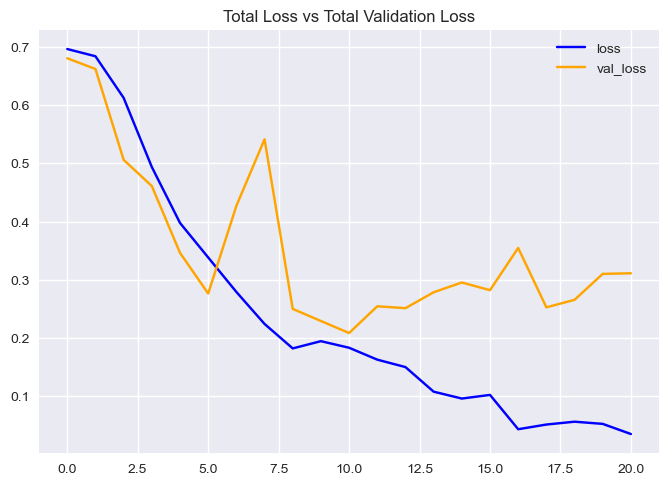

In [38]:
plot_metric(MobBiLSTM_model_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')

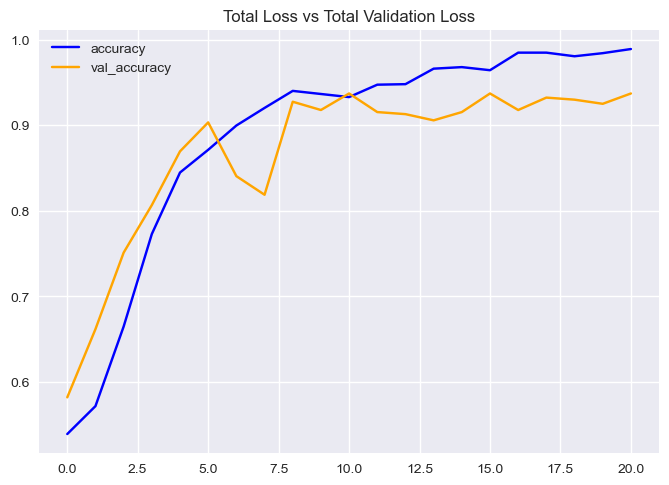

In [39]:
plot_metric(MobBiLSTM_model_history, 'accuracy', 'val_accuracy', 'Total Loss vs Total Validation Loss')

This function plots training and validation metrics (like accuracy or loss) over epochs. It helps visualize the model's performance and compare both curves using matplotlib.

# **Predicting the Test Set**

In [41]:
labels_predict = MoBiLSTM_model.predict(features_test)

8/8 [==============================] - 5s 345ms/step


In [42]:
# Decoding the data to use in Metrics
labels_predict = np.argmax(labels_predict , axis=1)
labels_test_normal = np.argmax(labels_test , axis=1)

In [43]:
labels_test_normal.shape , labels_predict.shape

((230,), (230,))

Accuracy Score

In [45]:
from sklearn.metrics import accuracy_score
AccScore = accuracy_score(labels_predict, labels_test_normal)
print('Accuracy Score is : ', AccScore)

Accuracy Score is :  0.9347826086956522


## Confusion Matrix

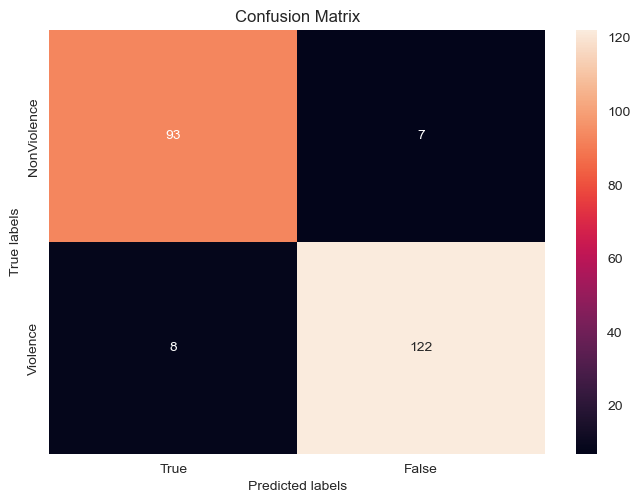

In [47]:
import seaborn as sns 
from sklearn.metrics import confusion_matrix

ax= plt.subplot()
cm=confusion_matrix(labels_test_normal, labels_predict)
sns.heatmap(cm, annot=True, fmt='g', ax=ax);  

ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['True', 'False']); ax.yaxis.set_ticklabels(['NonViolence', 'Violence']);

## Classification Report

In [49]:
from sklearn.metrics import classification_report

ClassificationReport = classification_report(labels_test_normal,labels_predict)
print('Classification Report is : \n', ClassificationReport)

Classification Report is : 
               precision    recall  f1-score   support

           0       0.92      0.93      0.93       100
           1       0.95      0.94      0.94       130

    accuracy                           0.93       230
   macro avg       0.93      0.93      0.93       230
weighted avg       0.93      0.93      0.93       230



# **Prediction Frame By Frame**

In [51]:
def predict_frames(video_file_path, output_file_path, SEQUENCE_LENGTH):
    
    # Read from the video file.
    video_reader = cv2.VideoCapture(video_file_path)
 
    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
 
    # VideoWriter to store the output video in the disk.
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('m', 'p', '4', 'v'), 
                                    video_reader.get(cv2.CAP_PROP_FPS), (original_video_width, original_video_height))
 
    # Declare a queue to store video frames.
    frames_queue = deque(maxlen = SEQUENCE_LENGTH)
 
    # Store the predicted class in the video.
    predicted_class_name = ''
 
    # Iterate until the video is accessed successfully.
    while video_reader.isOpened():
 
        ok, frame = video_reader.read() 
        
        if not ok:
            break
 
        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        
        # Normalize the resized frame 
        normalized_frame = resized_frame / 255
 
        # Appending the pre-processed frame into the frames list.
        frames_queue.append(normalized_frame)
 
        # We Need at Least number of SEQUENCE_LENGTH Frames to perform a prediction.
        # Check if the number of frames in the queue are equal to the fixed sequence length.
        if len(frames_queue) == SEQUENCE_LENGTH:                        
 
            # Pass the normalized frames to the model and get the predicted probabilities.
            predicted_labels_probabilities = MoBiLSTM_model.predict(np.expand_dims(frames_queue, axis = 0))[0]
 
            # Get the index of class with highest probability.
            predicted_label = np.argmax(predicted_labels_probabilities)
 
            # Get the class name using the retrieved index.
            predicted_class_name = CLASSES_LIST[predicted_label]
 
        # Write predicted class name on top of the frame.
        if predicted_class_name == "Violence":
            cv2.putText(frame, predicted_class_name, (5, 100), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 0, 255), 12)
        else:
            cv2.putText(frame, predicted_class_name, (5, 100), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 255, 0), 12)
         
        # Write The frame into the disk using the VideoWriter
        video_writer.write(frame)                       
        
    video_reader.release()
    video_writer.release()

In [52]:
plt.style.use("default")

# To show Random Frames from the saved output predicted video (output predicted video doesn't show on the notebook but can be downloaded)
def show_pred_frames(pred_video_path): 

    plt.figure(figsize=(20,15))

    video_reader = cv2.VideoCapture(pred_video_path)

    # Get the number of frames in the video.
    frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    
    # Get Random Frames from the video then Sort it
    random_range = sorted(random.sample(range (SEQUENCE_LENGTH , frames_count ), 12))
        
    for counter, random_index in enumerate(random_range, 1):
        
        plt.subplot(5, 4, counter)

        # Set the current frame position of the video.  
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, random_index)
          
        ok, frame = video_reader.read() 

        if not ok:
          break 

        frame = cv2.cvtColor(frame , cv2.COLOR_BGR2RGB)

        plt.imshow(frame);ax.figure.set_size_inches(20,20);plt.tight_layout()
                            
    video_reader.release()

In [53]:
# Construct the output video path.
test_videos_directory = 'test_videos'
os.makedirs(test_videos_directory, exist_ok = True)
 
output_video_file_path = f'{test_videos_directory}/Output-Test-Video.mp4'

1/1 [==============================] - 0s 37ms/step


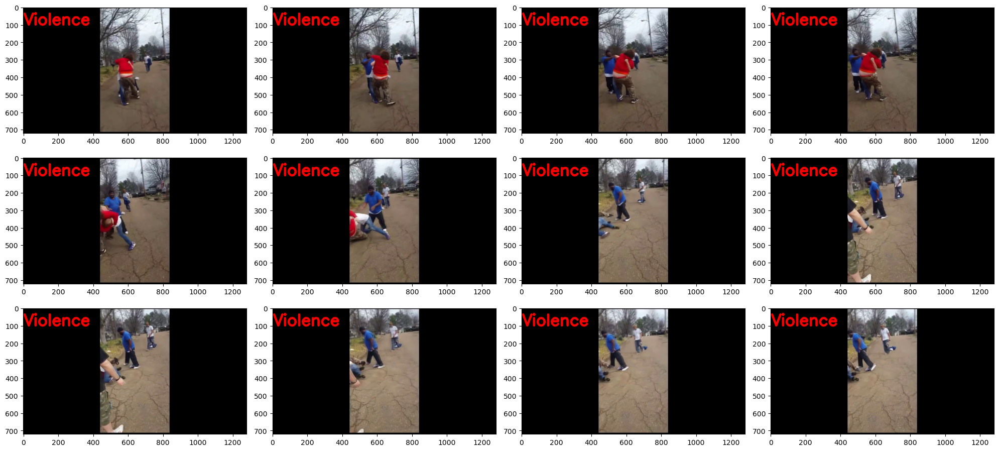

In [54]:
# Specifying video to be predicted
input_video_file_path = r"C:\Users\mazen\Downloads\Violence Data\Real Life Violence Dataset\Violence\V_117.mp4"

# Perform Prediction on the Test Video.
predict_frames(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)

# Show random frames from the output video
show_pred_frames(output_video_file_path)

In [55]:
# Play the actual video
Play_Video(input_video_file_path)

1/1 [==============================] - 0s 35ms/step


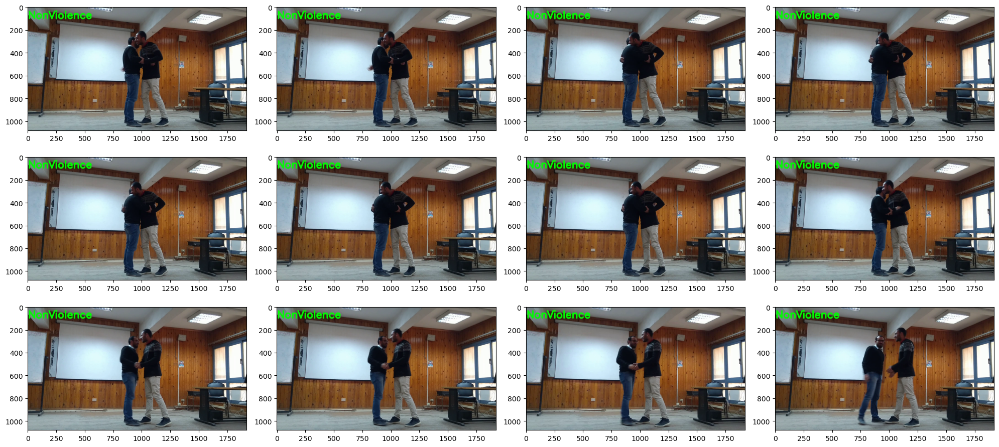

In [56]:
# Specifying video to be predicted
input_video_file_path = r"C:\Users\mazen\Downloads\Violence Data\Real Life Violence Dataset\NonViolence\NV_1.mp4"

# Perform Prediction on the Test Video.
predict_frames(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)

# Show random frames from the output video
show_pred_frames(output_video_file_path)

In [57]:
# Play the actual video
Play_Video(input_video_file_path)

# **Prediction For The Video**

In [59]:
def predict_video(video_file_path, SEQUENCE_LENGTH):
 
    video_reader = cv2.VideoCapture(video_file_path)
 
    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
 
    # Declare a list to store video frames we will extract.
    frames_list = []
    
    # Store the predicted class in the video.
    predicted_class_name = ''
 
    # Get the number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
 
    # Calculate the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH),1)
 
    # Iterating the number of times equal to the fixed length of sequence.
    for frame_counter in range(SEQUENCE_LENGTH):
 
        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)
 
        success, frame = video_reader.read() 
 
        if not success:
            break
 
        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        
        # Normalize the resized frame.
        normalized_frame = resized_frame / 255
        
        # Appending the pre-processed frame into the frames list
        frames_list.append(normalized_frame)
 
    # Passing the  pre-processed frames to the model and get the predicted probabilities.
    predicted_labels_probabilities = MoBiLSTM_model.predict(np.expand_dims(frames_list, axis = 0))[0]
 
    # Get the index of class with highest probability.
    predicted_label = np.argmax(predicted_labels_probabilities)
 
    # Get the class name using the retrieved index.
    predicted_class_name = CLASSES_LIST[predicted_label]
    
    # Display the predicted class along with the prediction confidence.
    print(f'Predicted: {predicted_class_name}\nConfidence: {predicted_labels_probabilities[predicted_label]}')
        
    video_reader.release()

In [60]:
# Specifying video to be predicted
input_video_file_path = r"C:\Users\mazen\Downloads\Violence Data\Real Life Violence Dataset\Violence\V_102.mp4"

# Perform Single Prediction on the Test Video.
predict_video(input_video_file_path, SEQUENCE_LENGTH)

# Play the actual video
Play_Video(input_video_file_path)

1/1 [==============================] - 0s 39ms/step
Predicted: Violence
Confidence: 0.7995849251747131


In [61]:
# Specifying video to be predicted
input_video_file_path = r"C:\Users\mazen\Downloads\Violence Data\Real Life Violence Dataset\NonViolence\NV_352.mp4"

# Perform Single Prediction on the Test Video.
predict_video(input_video_file_path, SEQUENCE_LENGTH)

# Play the actual video
Play_Video(input_video_file_path)

1/1 [==============================] - 0s 41ms/step
Predicted: NonViolence
Confidence: 0.99981290102005


In [63]:
def create_model():
    model = Sequential()
    model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))
    model.add(MaxPooling2D(2, 2))
    model.add(Flatten())
    model.add(Dense(64, activation='relu'))
    model.add(Dense(2, activation='softmax'))  
    return model


In [64]:
MoBiLSTM_model.save("violence_model.h5")


C:\Users\mazen\anaconda3\lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [65]:
from tensorflow.keras.models import load_model

model = load_model("violence_model.h5")


In [66]:
from tensorflow.keras.preprocessing import image
import numpy as np

# Step 1: صورة واحدة بحجم 64x64
img = image.load_img(r"C:\Users\mazen\Downloads\Violence Data\Real Life Violence Dataset\Screenshot 2025-04-17 202217.png", target_size=(64, 64))
img_array = image.img_to_array(img)
img_array = img_array / 255.0  # normalize

# Step 2: كرّر الصورة 16 مرة علشان تعمل sequence
sequence = np.repeat(img_array[np.newaxis, :, :, :], 16, axis=0)  # shape = (16, 64, 64, 3)

# Step 3: ضيف الباتش dimension
sequence = np.expand_dims(sequence, axis=0)  # shape = (1, 16, 64, 64, 3)


1/1 [==============================] - 2s 2s/step
Predicted Class: Violence
Probabilities: [[0.00233218 0.99766785]]


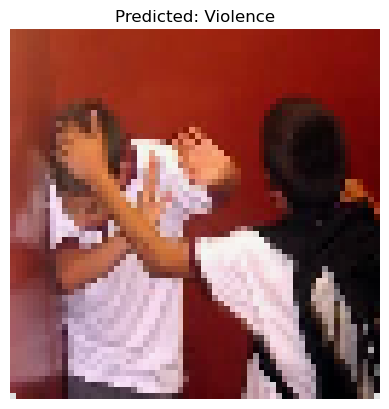

In [3]:
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

# تحميل الصورة
img_path = r"C:\Users\mazen\Downloads\Screenshot 2025-04-16 224012.png"
img = image.load_img(img_path, target_size=(64, 64))
img_array = image.img_to_array(img)
img_array = img_array / 255.0  # Normalization لو كنت عامل كده أثناء التدريب

# تكرار الصورة 16 مرة علشان نعمل sequence
sequence = np.repeat(img_array[np.newaxis, :, :, :], 16, axis=0)  # (16, 64, 64, 3)
sequence = np.expand_dims(sequence, axis=0)  # (1, 16, 64, 64, 3)

# تحميل الموديل
model = load_model("violence_model.h5")

# التنبؤ
pred = model.predict(sequence)
predicted_class = np.argmax(pred, axis=1)
class_names = ['NonViolence', 'Violence']  # حسب ترتيبك

# طباعة النتيجة
print("Predicted Class:", class_names[predicted_class[0]])
print("Probabilities:", pred)

# عرض الصورة مع التسمية
plt.imshow(np.array(img).astype("uint8"))
plt.title(f"Predicted: {class_names[predicted_class[0]]}")
plt.axis('off')
plt.show()


In [68]:
MoBiLSTM_model.save("MoBiLSTM_model.keras")


In [69]:
from tensorflow import keras

# Load the model
model = keras.models.load_model("MoBiLSTM_model.keras")


In [70]:
from IPython.display import FileLink

MoBiLSTM_model.save("MoBiLSTM_model.keras")
FileLink("MoBiLSTM_model.keras")


C:\Users\mazen\MoBiLSTM_model.keras

In [71]:
MoBiLSTM_model.save("violence_model.keras")  # صيغة حديثة مدعومة


In [1]:
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.mobilenet import preprocess_input
import os

# ==== Load model ====
model_path = r"C:\Users\mazen\Desktop\project\violence_model.h5"
model = load_model(model_path)

# ==== Load video ====
video_path = r"C:\Users\mazen\Downloads\3026357-uhd_3840_2160_30fps.mp4"
cap = cv2.VideoCapture(video_path)

# ==== Settings ====
frames_resized = []
frames_original = []
all_preds = []
violence_count = 0
total = 0

# ==== Read & predict ====
while True:
    ret, frame = cap.read()
    if not ret:
        break

    frame_original = frame.copy()  # Keep original for display
    frame_resized = cv2.resize(frame, (64, 64))  # Resize for model

    frames_original.append(frame_original)
    frames_resized.append(frame_resized)

    if len(frames_resized) == 16:
        input_batch = np.expand_dims(np.array(frames_resized), axis=0)  # shape: (1, 16, 64, 64, 3)
        input_batch = preprocess_input(input_batch)

        preds = model.predict(input_batch)
        label = np.argmax(preds[0])
        label_text = "Violence" if label == 1 else "No Violence"
        all_preds.append(label)

        if label == 1:
            violence_count += 1

        for f in frames_original:
            f_disp = cv2.resize(f, (800, 600))
            cv2.putText(f_disp, label_text, (30, 50), cv2.FONT_HERSHEY_SIMPLEX, 1.5,
                        (0, 0, 255) if label == 1 else (0, 255, 0), 3)
            cv2.imshow("Violence Detection", f_disp)
            if cv2.waitKey(30) & 0xFF == ord('q'):
                break

        frames_resized = []
        frames_original = []
        total += 1

cap.release()
cv2.destroyAllWindows()

# ==== Final result ====
print("="*40)
print(f"Total predictions: {total}")
print(f"Violence predictions: {violence_count}")
print(f"Non-Violence predictions: {total - violence_count}")

# Threshold (e.g. if more than 20% of clips are violent)
threshold = 0.2
if total > 0 and (violence_count / total) >= threshold:
    print("⚠️ Final Video Classification: VIOLENCE DETECTED")
else:
    print("✅ Final Video Classification: NO VIOLENCE DETECTED")
print("="*40)





1/1 [==============================] - 0s 44ms/step
Total predictions: 60
Violence predictions: 8
Non-Violence predictions: 52
✅ Final Video Classification: NO VIOLENCE DETECTED
